# Independent Experimental Dataset and Calibration Dataset

This notebook prepares the independent clinopyroxene-liquid experimental dataset, performs data cleaning and equilibrium checks, and generates dataset and calibration-comparison figures used in the paper.


# Modules and data imports

In [1]:
from pathlib import Path
import sys

def _find_project_root(start=None):
    """Find the project root by walking upward from the current directory."""
    path = Path.cwd() if start is None else Path(start).resolve()
    for candidate in (path, *path.parents):
        if (candidate / "pyproject.toml").exists():
            return candidate
    raise FileNotFoundError("Could not find pyproject.toml above the current directory.")

PROJECT_ROOT = _find_project_root()
PAPER_DIR = PROJECT_ROOT / "paper"
CACHE_DIR = PAPER_DIR / ".cache"
IMAGES_DIR = PAPER_DIR / ".images"
DATA_DIR = PAPER_DIR / "data"
for _dir in (CACHE_DIR, IMAGES_DIR, DATA_DIR):
    _dir.mkdir(parents=True, exist_ok=True)

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np

import os
import time
import importlib
import matplotlib.pyplot as plt
from aims4pt.model_tools.model_registry import  get_models_initial_pools, ALL_MODELS_MODULES
for module in ALL_MODELS_MODULES:
    importlib.import_module(module)





calculate_shap = False # make sure this to False when not needed, as it takes time and memory

timestamp = time.strftime("%Y%m%d_%H%M")

# Independent Experimental Dataset 
Apply cpx oxide-total screening, cpx stoichiometric screening, and Fe-Mg Kd equilibrium filtering.

In [2]:
unseen_experiments_path = os.path.join(DATA_DIR, "independent_data_raw.xlsx")

unseen_experiments_df = pd.read_excel(unseen_experiments_path)

#col names for unseen_experiments_df
cpx_names = ['SiO2_cpx', 'TiO2_cpx', 'Al2O3_cpx',
       'Fe2O3_cpx', 'Cr2O3_cpx', 'FeO_cpx', 'MnO_cpx', 'MgO_cpx', 'NiO_cpx',
       'CoO_cpx', 'CaO_cpx', 'Na2O_cpx', 'K2O_cpx', 'P2O5_cpx',]
liq_names = ['SiO2_liq', 'TiO2_liq', 'Al2O3_liq',
       'Fe2O3_liq', 'Cr2O3_liq', 'FeO_liq', 'MnO_liq', 'MgO_liq', 'NiO_liq',
       'CoO_liq', 'CaO_liq', 'Na2O_liq', 'K2O_liq', 'P2O5_liq',]
P_col = 'P (kbar)'
T_col = 'T (C)'


## Cleaning and equilibrium filtering



In [3]:
print("Before cleaning, unseen_experiments_df shape:", unseen_experiments_df.shape)
cpx_total = unseen_experiments_df[cpx_names].sum(axis=1)
unseen_experiments_df = unseen_experiments_df[(cpx_total>98)&(cpx_total<102)].reset_index(drop=True)
print("After total, unseen_experiments_df shape:", unseen_experiments_df.shape)
from aims4pt.data_tools.compositions import cpx_calculation
cpx_params = cpx_calculation(unseen_experiments_df[cpx_names])
MdivT= cpx_params["(Ca+Fe+Mg)/Si"]
unseen_experiments_df = unseen_experiments_df[(MdivT>0.9)&(MdivT<1.1)].reset_index(drop=True)
print("After cpx MdivT, unseen_experiments_df shape:", unseen_experiments_df.shape)
# kd filter


from aims4pt.data_tools.equilibrium import kdEquilibrium_test
mask, kd_values = kdEquilibrium_test(
    unseen_experiments_df[cpx_names],
    unseen_experiments_df[liq_names],
    kd = 0.28,
    error = 0.08,
    mode='Fe-Mg',)
unseen_experiments_df = unseen_experiments_df[mask].reset_index(drop=True)
print("After kd filter, unseen_experiments_df shape:", unseen_experiments_df.shape)
liq_total = unseen_experiments_df[liq_names].sum(axis=1)
liq_total.describe()

Before cleaning, unseen_experiments_df shape: (517, 36)
After total, unseen_experiments_df shape: (497, 36)
After cpx MdivT, unseen_experiments_df shape: (441, 36)
After kd filter, unseen_experiments_df shape: (293, 36)


count    293.000000
mean      98.324335
std        2.691512
min       86.971390
25%       97.802000
50%       99.813648
75%      100.000000
max      100.660000
dtype: float64

In [4]:

cpx_unseen = unseen_experiments_df[cpx_names].copy()
liq_unseen = unseen_experiments_df[liq_names].copy()
meta_unseen = unseen_experiments_df[[P_col, T_col]].copy()
# stratified split
from sklearn.model_selection import StratifiedShuffleSplit

sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
P_values = unseen_experiments_df[P_col]
target_bin_size = 50
num_bins = max(2, min(10, len(P_values) // target_bin_size))
P_binned = pd.qcut(P_values, q=num_bins, labels=False, duplicates="drop")
(strat_train_idx, strat_test_idx), = sss.split(unseen_experiments_df, P_binned)
training_unseen_id = unseen_experiments_df.iloc[strat_train_idx].index
testing_unseen_id = unseen_experiments_df.iloc[strat_test_idx].index

#random split
# from sklearn.model_selection import train_test_split
# training_unseen_id, testing_unseen_id = train_test_split(
#     unseen_experiments_df.index,
#     test_size=0.2,
#     random_state=42,
#     )


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(


T range:  700.0  -  1350.0
P range:  0.001  -  30.0


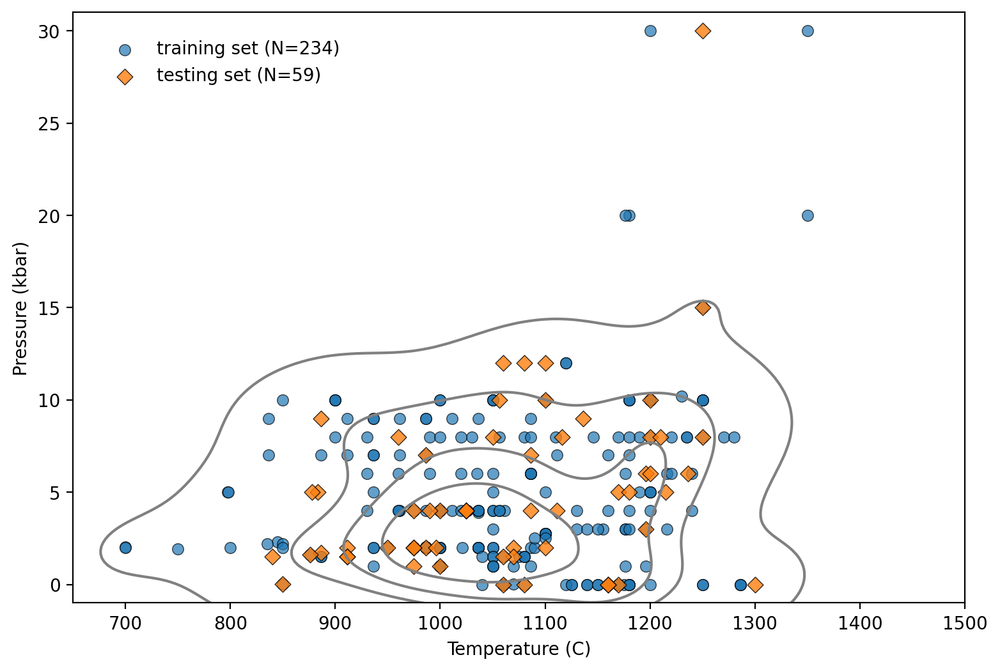

In [5]:
# P-T scatter plot for unseen test set
import seaborn as sns
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)
# training set
ax.scatter(meta_unseen.loc[training_unseen_id][T_col], meta_unseen.loc[training_unseen_id][P_col], 
           alpha=0.7, label=f'training set (N={len(training_unseen_id)})', marker='o', s =40, edgecolors='k', linewidths=0.5)
sns.kdeplot(
    data=meta_unseen,
    x=T_col,
    y=P_col,
    levels=5,
    linewidth = 0.8,
    color = "grey"
)
# testing set
ax.scatter(meta_unseen.loc[testing_unseen_id][T_col], meta_unseen.loc[testing_unseen_id][P_col], 
           alpha=0.8, label=f'testing set (N={len(testing_unseen_id)})', marker='D', s= 40, edgecolors='k', linewidths=0.5)
# sns.kdeplot( 
#     data=meta_unseen,
#     x=T_col,
#     y=P_col,
#     levels=5,
#     color='red',)
ax.set_xlabel("Temperature (C)")
ax.set_ylabel("Pressure (kbar)")
ax.set_xlim(650,1500)
ax.set_ylim(-1, 31)
# in axes legend upper left
ax_tp = ax.transAxes
ax.legend(loc = 'upper left', frameon=False,
          fontsize=10,         bbox_to_anchor=(0.02, 0.98),          # Upper-left inside the axes.
        bbox_transform=ax_tp  )

# print p t max min
print("T range: ", meta_unseen[T_col].min(), " - ", meta_unseen[T_col].max())
print("P range: ", meta_unseen[P_col].min(), " - ", meta_unseen[P_col].max())


## Comparison with GEORO

C:\Users\13493\AppData\Local\Temp\ipykernel_74104\3853685169.py:3: DtypeWarning: Columns (1,2,3,4,9,12,13,16,17,18,19,20,21,22,23,24,28,29,37,40,41,42,46,52,53,54,55,78,80,83,86,98,100,102,104,115,117,122,124,129,131,133,135,141,143,149,161,163,166,170,173,176,185,196,198,202,205,208,211,214,217,220,224,227,230,233,236,239,242,245,248,251,272,283,287,291,293,294,302,305,312,314,318,329,330,332,333,339,341,348,349,350,351,359,360,363,366,368,395,416,449,452) have mixed types. Specify dtype option on import or set low_memory=False.
  georoc_df_raw=pd.read_csv(os.path.join(DATA_DIR, "GEOROC_cpx.csv"))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


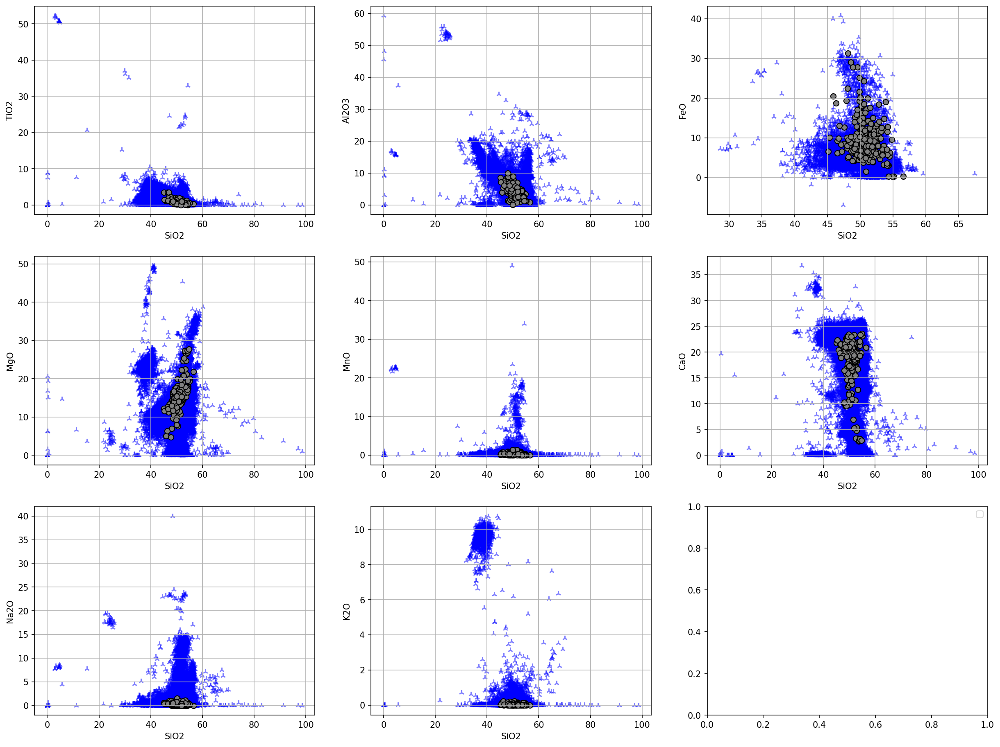

In [6]:
run_compare_natural_exp_dataset = True
if run_compare_natural_exp_dataset:
    georoc_df_raw=pd.read_csv(os.path.join(DATA_DIR, "GEOROC_cpx.csv"))

    xy_pairs = [("SiO2", "TiO2"), ("SiO2", "Al2O3"), ("SiO2", "FeO"),
                ("SiO2", "MgO"), ("SiO2", "MnO"), ("SiO2", "CaO"),
                ("SiO2", "Na2O"), ("SiO2", "K2O")]
    georoc_df = georoc_df_raw.rename(columns = {
        "SIO2(WT%)":"SiO2_cpx",
        "TIO2(WT%)":"TiO2_cpx",
        "AL2O3(WT%)":"Al2O3_cpx",
        "FEO(WT%)":"FeO_cpx",
        "MNO(WT%)":"MnO_cpx",
        "MGO(WT%)":"MgO_cpx",
        "CAO(WT%)":"CaO_cpx",
        "NA2O(WT%)":"Na2O_cpx",
        "K2O(WT%)":"K2O_cpx",
        
    })

    interested_cpx_features = ["SiO2_cpx", "TiO2_cpx", "Al2O3_cpx",
    "FeO_cpx", "MnO_cpx", "MgO_cpx", "CaO_cpx",
        "Na2O_cpx", "K2O_cpx"]

    for ele in interested_cpx_features:
        georoc_df[ele] = pd.to_numeric(georoc_df[ele], errors='coerce')

    from aims4pt.visualization.composition_plot import compare_natural_exp_dataset
    compare_natural_exp_dataset(
        georoc_df[interested_cpx_features],
        unseen_experiments_df[interested_cpx_features],
        xy_pairs,
    )

# Initial all thermobarometry models

In [7]:
P_model_pool = get_models_initial_pools("P", "both" , False) # get all P models including cpx_only and cpx_liq
P_model_names = list(model.model_name for model in P_model_pool)
T_model_pool = get_models_initial_pools("T", "both" , False) # get all T models including cpx_only and cpx_liq
T_model_names = list(model.model_name for model in T_model_pool)


[跳过] 初始化模型 Brugman_Till_19 时出错: Brugman_Till_19 only supports temperature (T) calculations, not pressure (P) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

[跳过] 初始化模型 Brugman_Till_19 时出错: Brugman_Till_19 only supports temperature (T) calculations, not pressure (P) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

[skipped] Error initializing model <class 'aims4pt.model_tools.Neave_Putirka_17.Neave_Putirka_17'> with T: Pu08_eq33_T, P: eq1_P - Neave_Putirka_17 only supports pressure (P) calculations, not temperature (T) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

In [8]:
P_model_dict = {model.model_name: model for model in P_model_pool}
T_model_dict = {model.model_name: model for model in T_model_pool}

In [9]:
P_model_dict

{'Putirka, 2008 eq32d_T; eq32a_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32a_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.1 kbar
         comment: None
         ,
 'Putirka, 2008 eq32d_T; eq32b_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32b_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: True
         uncertainty: 2.6 kbar
         comment: None
         ,
 'Petrelli et al., 2020 (cpx_only)': 
         ModelManager: Petrelli20
         Model name: Petrelli et al., 2020 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.2 kbar
         comment: None
         ,
 'Higgins et al., 2021 (cpx_only)': 
         ModelManager: Higgins21
         Model name: Higgins et al., 2021 (cpx_only)
         interested parameter: P; cpx-only
       

# Independent dataset

Prepare the independent dataset panels that provide the data source for Figure 5.

## TAS and P-T panels

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_fun

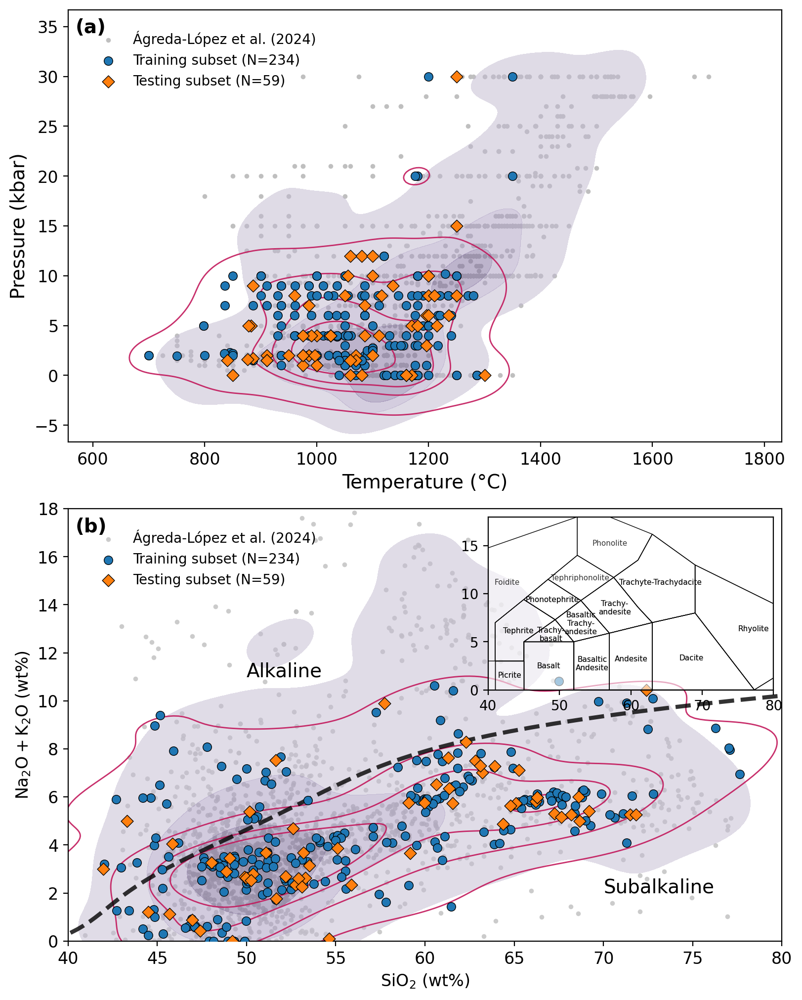

T range: 700.0 - 1350.0
P range: 0.001 - 30.0


In [10]:
from paper.scripts.figure_helpers import (
    _get_agreda_reference_model__nb00_c16 as _get_agreda_reference_model,
)

# Cell: individual dataset
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from aims4pt.visualization.composition_plot import plot_glass_TAS_diagram
from mpl_toolkits.axes_grid1.inset_locator import inset_axes




# Select one unified reference calibration dataset for both TAS and P-T panels.
reference_label = "Ágreda-López et al. (2024)"


agreda_P_model = _get_agreda_reference_model("P")
agreda_T_model = _get_agreda_reference_model("T")

agreda_reference_pt = agreda_P_model.X_cpx_all.copy()
agreda_reference_t = agreda_T_model.X_cpx_all.copy()
if "Sample_ID" in agreda_reference_pt.columns and "Sample_ID" in agreda_reference_t.columns:
    agreda_reference_t = agreda_reference_t[["Sample_ID", "T_C"]].dropna(subset=["T_C"]).drop_duplicates("Sample_ID")
    agreda_reference_pt = agreda_reference_pt.drop(columns=["T_C"], errors="ignore").merge(
        agreda_reference_t,
        on="Sample_ID",
        how="left",
    )
elif "T_C" not in agreda_reference_pt.columns and len(agreda_reference_pt) == len(agreda_reference_t):
    agreda_reference_pt["T_C"] = agreda_reference_t["T_C"].to_numpy()
agreda_reference_pt = agreda_reference_pt.dropna(subset=["T_C", "P_kbar"])

agreda_reference_liq = agreda_P_model.X_liq_all.copy()

# =========================
# Create figure with 2 rows
# =========================
fig, (ax1, ax2) = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(8, 10),
    dpi=200,
    sharex=False,
    layout="constrained"   # Use constrained layout for alignment and spacing.
)

# =========================
# (a) P–T scatter plot
# =========================

# unified reference calibration background
ax1.scatter(
    agreda_reference_pt["T_C"],
    agreda_reference_pt["P_kbar"],
    color="0.75",
    label=reference_label,
    marker="o",
    s=12,
    linewidths=0,
    alpha=1,
    zorder=0,
)
sns.kdeplot(
    x=agreda_reference_pt["T_C"],
    y=agreda_reference_pt["P_kbar"],
    linewidth=1,  
    fill=True,
    color="#D8D2E3",
    alpha=0.5,
    ax=ax1,
    zorder=0.5,
    levels=4,
)

sns.kdeplot(
    data=meta_unseen.loc[training_unseen_id],
    x=T_col,
    y=P_col,
    levels=5,
    linewidth=2,
    color="#C2185B",
    alpha=0.9,
    ax=ax1,
    zorder=1,
)

# training set
ax1.scatter(
    meta_unseen.loc[training_unseen_id][T_col],
    meta_unseen.loc[training_unseen_id][P_col],
    alpha=1,
    label=f"Training subset (N={len(training_unseen_id)})",
    marker="o",
    s=40,
    edgecolors="k",
    linewidths=0.5,
    zorder=3,
)

# testing set
ax1.scatter(
    meta_unseen.loc[testing_unseen_id][T_col],
    meta_unseen.loc[testing_unseen_id][P_col],
    alpha=1,
    label=f"Testing subset (N={len(testing_unseen_id)})",
    marker="D",
    s=40,
    edgecolors="k",
    linewidths=0.5,
    zorder=4,
)
# axis labels
ax1.set_xlabel("Temperature (°C)", fontsize=14)
ax1.set_ylabel("Pressure (kbar)", fontsize=14)

# tick labels
ax1.tick_params(axis="both", labelsize=12)

# legend
ax1.legend(
    loc="upper left",
    frameon=False,
    fontsize=10,
    bbox_to_anchor=(0.02, 0.98),
    bbox_transform=ax1.transAxes,
)

# panel label
ax1.text(
    0.01, 0.98, "(a)",
    transform=ax1.transAxes,
    va="top",
    ha="left",
    fontsize=14,
    fontweight="bold",
)


# =========================
# (b) TAS diagram
# =========================

alkaline_wt = liq_unseen["Na2O_liq"] + liq_unseen["K2O_liq"]
sio2_wt = liq_unseen["SiO2_liq"]
agreda_alkaline_wt = agreda_reference_liq["Na2O_liq"] + agreda_reference_liq["K2O_liq"]
agreda_sio2_wt = agreda_reference_liq["SiO2_liq"]
agreda_tas_mask = np.isfinite(agreda_sio2_wt) & np.isfinite(agreda_alkaline_wt)


ax2.scatter(
    agreda_sio2_wt.loc[agreda_tas_mask],
    agreda_alkaline_wt.loc[agreda_tas_mask],
    color="0.75",
    label=reference_label,
    marker="o",
    s=12,
    linewidths=0,
    alpha=0.8,
    zorder=0,
)

sns.kdeplot(
    x=agreda_sio2_wt.loc[agreda_tas_mask],
    y=agreda_alkaline_wt.loc[agreda_tas_mask],
    linewidth=0.8,  
    fill=True,
    color="#D8D2E3",
    alpha=0.5,
    ax=ax2,
    zorder=0.5,
    levels=4,
)
sns.kdeplot(
    x=sio2_wt.loc[training_unseen_id],
    y=alkaline_wt.loc[training_unseen_id],
    levels=5,
    linewidth=2,
    color="#C2185B",
    alpha=0.9,
    ax=ax2,
    zorder=1,
)

ax2.scatter(
    sio2_wt.loc[training_unseen_id],
    alkaline_wt.loc[training_unseen_id],
    color="C0",
    label=f"Training subset (N={len(training_unseen_id)})",
    marker="o",
    s=40,
    linewidth=0.5,
    edgecolors="k",
    alpha=1,
    zorder=3,
)
ax2.scatter(
    sio2_wt.loc[testing_unseen_id],
    alkaline_wt.loc[testing_unseen_id],
    color="C1",
    marker="D",
    label=f"Testing subset (N={len(testing_unseen_id)})",
    s=40,
    linewidth=0.5,
    edgecolors="k",
    alpha=1,
    zorder=4,
)

y_min, y_max = (0, 16)
ys = np.linspace(y_min, y_max, 100)
Na2O_plus_K2O_boundary = (
    -3.3539e-4 * ys**6
    + 1.2030e-2 * ys**5
    - 1.5188e-1 * ys**4
    + 8.6096e-1 * ys**3
    - 2.1111    * ys**2
    + 3.9492    * ys
    + 39.0
)
ax2.plot(Na2O_plus_K2O_boundary, ys, color='black', linestyle='--', linewidth=3, alpha = 0.8)

# alkaline and subalkaline
ax2.text(70, 2, "Subalkaline", fontsize=14, color='black', alpha=1)
ax2.text(50, 11, "Alkaline", fontsize=14, color='black', alpha=1) 

ax2.set_xlabel(r"$\mathrm{SiO_2}$ (wt%)")
ax2.set_ylabel(r"$\mathrm{Na_2O + K_2O}$ (wt%)")

ax2.set_ylim(0, 18)
ax2.set_xlim(40, 80)

axins = inset_axes(
    ax2,
    width="40%",      # Relative to the main axis width.
    height="40%",     # Relative to the main axis height.
    loc="upper right",  # Upper-right position.
    borderpad=0.6     # Distance from the border.
)

# empty plot_glass_TAS_diagram
plot_glass_TAS_diagram(
    X_liq=liq_unseen.loc[training_unseen_id],
    model="LeMaitreCombined",
    axes=axins,
    color="C0",
    s=0,
    kde=False,
    marker="o",
    alpha=0,
    add_TAS_labels=True,
    plot_alkaline_boundary = False,

)
axins.set_xlim(40, 80)
axins.set_ylim(0, 18)
for t in axins.texts[0:]:
    t.set_fontsize(6) 
# cancel x and y labels
axins.set_xlabel("")
axins.set_ylabel("")
# Background.
axins.patch.set_facecolor("white")
axins.patch.set_alpha(0.6)

# TAS field boundaries.
for ln in axins.lines:
    ln.set_alpha(0.4)
    ln.set_linewidth(0.6)

# Rock-type labels.
for t in axins.texts:
    t.set_fontsize(5.5)
    t.set_alpha(0.8)




# axis labels
# ax2.set_xlabel("SiO2 (wt%)", fontsize=14)
# ax2.set_ylabel("Na2O + K2O (wt%)", fontsize=14)

# tick labels
ax2.tick_params(axis="both", labelsize=12)
ax2.legend(
    loc="upper left",
    frameon=False,
    fontsize=10,
    bbox_to_anchor=(0.02, 0.98),
    bbox_transform=ax2.transAxes,
)

# panel label
ax2.text(
    0.01, 0.98, "(b)",
    transform=ax2.transAxes,
    va="top",
    ha="left",
    fontsize=14,
    fontweight="bold",
)


# =========================
# Optional: save figure
# =========================
fig.savefig(IMAGES_DIR / "fig5_independent_dataset.pdf", bbox_inches="tight")
fig.savefig(IMAGES_DIR / "fig5_independent_dataset.png", dpi=300, bbox_inches="tight")

plt.show()

# =========================
# Print ranges (debug/info)
# =========================
print("T range:", meta_unseen[T_col].min(), "-", meta_unseen[T_col].max())
print("P range:", meta_unseen[P_col].min(), "-", meta_unseen[P_col].max())


## Comparison of Independent Dataset and Calibration dataset

Generate the combined P-T, TAS, and Cpx composition comparison figure for the independent dataset and reference calibration dataset.

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_fun

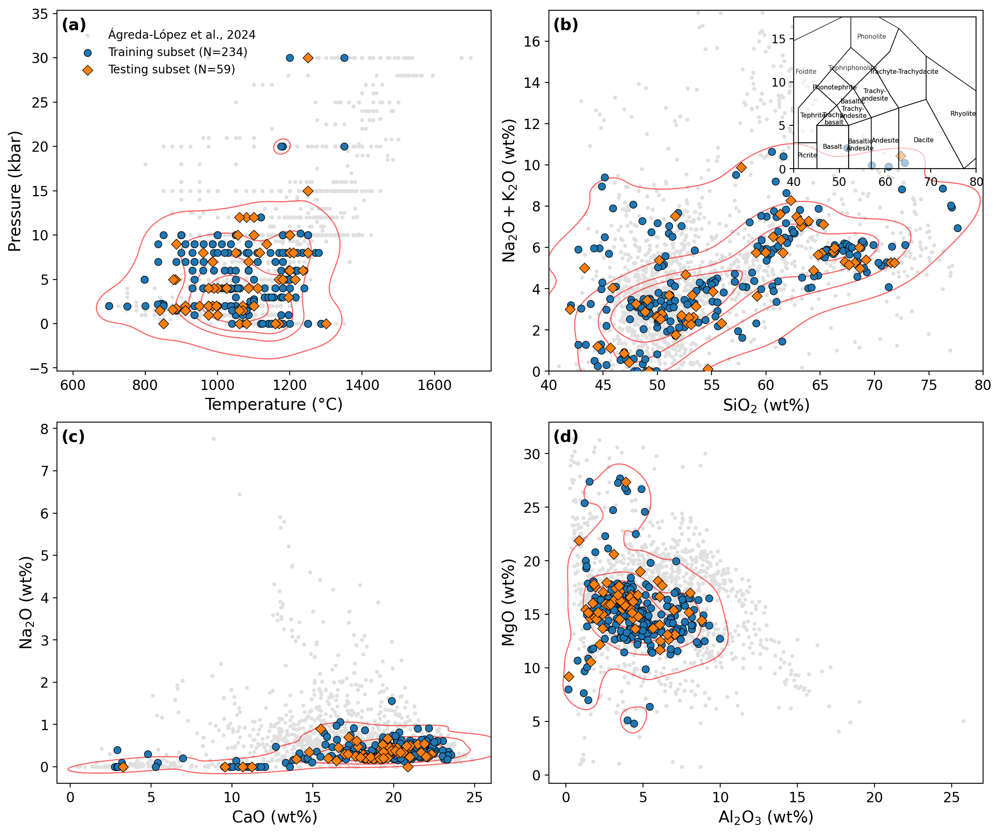

In [11]:
from paper.scripts.figure_helpers import (
    _get_agreda_reference_model__nb00_c18 as _get_agreda_reference_model,
    _panel_label__nb00_c18 as _panel_label,
    _set_pair_limits__nb00_c18 as _set_pair_limits,
    _valid_xy__nb00_c18 as _valid_xy,
)

# CELL: combined 2x2 P-T, TAS, and cpx composition comparison figure
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from aims4pt.visualization.composition_plot import plot_glass_TAS_diagram
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# Select one unified reference calibration dataset; switch this model here if needed later.
reference_label = "Ágreda-López et al., 2024"


agreda_P_model = _get_agreda_reference_model("P")
agreda_T_model = _get_agreda_reference_model("T")

agreda_reference_pt = agreda_P_model.X_cpx_all.copy()
agreda_reference_t = agreda_T_model.X_cpx_all.copy()
if "Sample_ID" in agreda_reference_pt.columns and "Sample_ID" in agreda_reference_t.columns:
    agreda_reference_t = agreda_reference_t[["Sample_ID", "T_C"]].dropna(subset=["T_C"]).drop_duplicates("Sample_ID")
    agreda_reference_pt = agreda_reference_pt.drop(columns=["T_C"], errors="ignore").merge(
        agreda_reference_t,
        on="Sample_ID",
        how="left",
    )
elif "T_C" not in agreda_reference_pt.columns and len(agreda_reference_pt) == len(agreda_reference_t):
    agreda_reference_pt["T_C"] = agreda_reference_t["T_C"].to_numpy()
agreda_reference_pt = agreda_reference_pt.dropna(subset=["T_C", "P_kbar"])

agreda_reference_liq = agreda_P_model.X_liq_all.copy()
agreda_reference_cpx = agreda_P_model.X_cpx_all.copy()

# Use the same cpx element pairs as the previous composition cell.
default_cpx_pairs = [
    ("CaO_cpx", "Na2O_cpx", r"$\mathrm{CaO}$ (wt%)", r"$\mathrm{Na_2O}$ (wt%)"),
    ("Al2O3_cpx", "MgO_cpx", r"$\mathrm{Al_2O_3}$ (wt%)", r"$\mathrm{MgO}$ (wt%)"),
]
cpx_composition_pairs = globals().get("cpx_composition_pairs", globals().get("cpx_pairs", default_cpx_pairs))[:2]




fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(12, 10),
    dpi=200,
    layout="constrained",
)
ax_pt, ax_tas, ax_cpx1, ax_cpx2 = axes.ravel()

# (a) P-T comparison
ax_pt.scatter(
    agreda_reference_pt["T_C"],
    agreda_reference_pt["P_kbar"],
    color="0.88",
    label=reference_label,
    marker="o",
    s=12,
    linewidths=0,
    alpha=1,
    zorder=0,
)
sns.kdeplot(
    data=meta_unseen.loc[training_unseen_id],
    x=T_col,
    y=P_col,
    levels=5,
    linewidth=0.8,
    color="red",
    alpha=0.6,
    ax=ax_pt,
    zorder=1,
)
ax_pt.scatter(
    meta_unseen.loc[training_unseen_id][T_col],
    meta_unseen.loc[training_unseen_id][P_col],
    alpha=1,
    label=f"Training subset (N={len(training_unseen_id)})",
    marker="o",
    s=40,
    edgecolors="k",
    linewidths=0.5,
    zorder=3,
)
ax_pt.scatter(
    meta_unseen.loc[testing_unseen_id][T_col],
    meta_unseen.loc[testing_unseen_id][P_col],
    alpha=1,
    label=f"Testing subset (N={len(testing_unseen_id)})",
    marker="D",
    s=40,
    edgecolors="k",
    linewidths=0.5,
    zorder=4,
)
ax_pt.set_xlabel("Temperature (°C)", fontsize=14)
ax_pt.set_ylabel("Pressure (kbar)", fontsize=14)
ax_pt.tick_params(axis="both", labelsize=12)
ax_pt.legend(loc="upper left", frameon=False, fontsize=10, bbox_to_anchor=(0.02, 0.98), bbox_transform=ax_pt.transAxes)
_panel_label(ax_pt, "(a)")

# (b) TAS comparison
alkaline_wt = liq_unseen["Na2O_liq"] + liq_unseen["K2O_liq"]
sio2_wt = liq_unseen["SiO2_liq"]
agreda_alkaline_wt = agreda_reference_liq["Na2O_liq"] + agreda_reference_liq["K2O_liq"]
agreda_sio2_wt = agreda_reference_liq["SiO2_liq"]
agreda_tas_mask = np.isfinite(agreda_sio2_wt) & np.isfinite(agreda_alkaline_wt)

ax_tas.scatter(
    agreda_sio2_wt.loc[agreda_tas_mask],
    agreda_alkaline_wt.loc[agreda_tas_mask],
    color="0.88",
    label=reference_label,
    marker="o",
    s=12,
    linewidths=0,
    alpha=1,
    zorder=0,
)
sns.kdeplot(
    x=sio2_wt.loc[training_unseen_id],
    y=alkaline_wt.loc[training_unseen_id],
    levels=5,
    linewidth=0.8,
    color="red",
    alpha=0.6,
    ax=ax_tas,
    zorder=1,
)
ax_tas.scatter(
    sio2_wt.loc[training_unseen_id],
    alkaline_wt.loc[training_unseen_id],
    color="C0",
    label=f"Training subset (N={len(training_unseen_id)})",
    marker="o",
    s=40,
    linewidth=0.5,
    edgecolors="k",
    alpha=1,
    zorder=3,
)
ax_tas.scatter(
    sio2_wt.loc[testing_unseen_id],
    alkaline_wt.loc[testing_unseen_id],
    color="C1",
    marker="D",
    label=f"Testing subset (N={len(testing_unseen_id)})",
    s=40,
    linewidth=0.5,
    edgecolors="k",
    alpha=1,
    zorder=4,
)
ax_tas.set_xlabel(r"$\mathrm{SiO_2}$ (wt%)", fontsize=14)
ax_tas.set_ylabel(r"$\mathrm{Na_2O + K_2O}$ (wt%)", fontsize=14)
ax_tas.set_xlim(40, 80)
ax_tas.set_ylim(0, 17.5)
ax_tas.tick_params(axis="both", labelsize=12)
_panel_label(ax_tas, "(b)")

axins = inset_axes(ax_tas, width="42%", height="42%", loc="upper right", borderpad=0.6)
plot_glass_TAS_diagram(
    X_liq=liq_unseen.loc[training_unseen_id],
    model="LeMaitreCombined",
    axes=axins,
    color="C0",
    s=0,
    kde=False,
    marker="o",
    alpha=0,
    add_TAS_labels=True,
)
axins.set_xlim(40, 80)
axins.set_ylim(0, 17.5)
axins.set_xlabel("")
axins.set_ylabel("")
axins.patch.set_facecolor("white")
axins.patch.set_alpha(0.6)
for ln in axins.lines:
    ln.set_alpha(0.4)
    ln.set_linewidth(0.6)
for t in axins.texts:
    t.set_fontsize(5.5)
    t.set_alpha(0.8)

# (c-d) cpx composition comparisons
for idx, (ax, (x_col, y_col, x_label, y_label)) in enumerate(zip([ax_cpx1, ax_cpx2], cpx_composition_pairs), start=2):
    ref_x, ref_y = _valid_xy(agreda_reference_cpx, x_col, y_col)
    train_x, train_y = _valid_xy(cpx_unseen.loc[training_unseen_id], x_col, y_col)
    test_x, test_y = _valid_xy(cpx_unseen.loc[testing_unseen_id], x_col, y_col)

    ax.scatter(
        ref_x,
        ref_y,
        color="0.88",
        label=reference_label,
        marker="o",
        s=12,
        linewidths=0,
        alpha=1,
        zorder=0,
    )
    sns.kdeplot(
        x=train_x,
        y=train_y,
        levels=5,
        linewidth=0.8,
        color="red",
        alpha=0.6,
        ax=ax,
        zorder=1,
    )
    ax.scatter(
        train_x,
        train_y,
        color="C0",
        label=f"Training subset (N={len(training_unseen_id)})",
        marker="o",
        s=40,
        edgecolors="k",
        linewidths=0.5,
        alpha=1,
        zorder=3,
    )
    ax.scatter(
        test_x,
        test_y,
        color="C1",
        label=f"Testing subset (N={len(testing_unseen_id)})",
        marker="D",
        s=40,
        edgecolors="k",
        linewidths=0.5,
        alpha=1,
        zorder=4,
    )

    _set_pair_limits(ax, [ref_x, train_x, test_x], [ref_y, train_y, test_y])
    ax.set_xlabel(x_label, fontsize=14)
    ax.set_ylabel(y_label, fontsize=14)
    ax.tick_params(axis="both", labelsize=12)
    _panel_label(ax, f"({chr(97 + idx)})")

fig.savefig(IMAGES_DIR / "PT_TAS_cpx_composition_combined.pdf", bbox_inches="tight")
fig.savefig(IMAGES_DIR / "PT_TAS_cpx_composition_combined.png", dpi=300, bbox_inches="tight")
plt.show()


# Calibration dataset of thermobarometry models

## TAS and P-T panels

In [12]:
demo_model_P_name = [
    'Chicchi et al., 2023 (cpx_only)',
 'Petrelli et al., 2020 (cpx_only)',
 'Ágreda-López et al., 2024 (cpx_only)',
 'Higgins et al., 2021 (cpx_only)',
 'Jorgenson et al., 2022 (cpx_only)',
 'Wang et al., 2021 (cpx_only)',
 'Neave & Putirka, 2017 Pu08_eq33_T; eq1_P (cpx_liq) (cpx_liq)',
]
demo_model_T_name = ['Brugman & Till, 2019 (cpx_liq)',]
demo_model_1 = [P_model_dict[model_name] for model_name in demo_model_P_name].copy()
demo_model_2 = [T_model_dict[model_name] for model_name in demo_model_T_name].copy()
demo_model = demo_model_1 + demo_model_2


demo_model_name = []
# change model name
for model in demo_model:
    # remove all after first "("
    demo_model_name.append(model.model_name.split(" (")[0])

In [13]:

demo_model_name[-2] = 'Neave & Putirka, 2017'

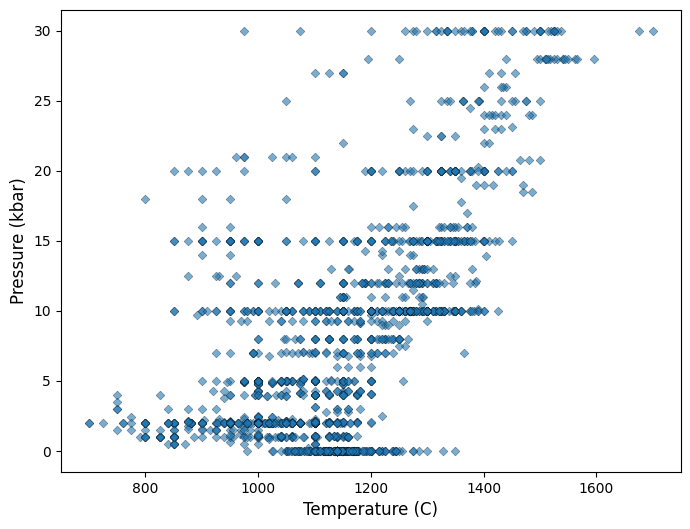

In [14]:
# combine Agreda reference model data for both P and T

Agreda_all_data_P = demo_model[2].X_cpx_all.copy()
Agreda_all_data_T = T_model_dict["Ágreda-López et al., 2024 (cpx_only)"].X_cpx_all.copy()

Agreda_all_data_P.set_index(keys="Sample_ID", inplace=True)
Agreda_all_data_T.set_index(keys="Sample_ID", inplace=True)
Agreda_all_data_P["T_C"] = Agreda_all_data_T["T_C"].copy()

fig, ax = plt.subplots(figsize=(8,6), dpi=100)
ax.scatter(Agreda_all_data_P["T_C"], Agreda_all_data_P["P_kbar"], alpha=0.6, s=20, edgecolors='k', linewidths=0.3)
ax.set_xlabel("Temperature (C)")
ax.set_ylabel("Pressure (kbar)")
demo_model[2].X_cpx_all = Agreda_all_data_P.reset_index()

In [15]:
# temporarily set Wang et al., 2021 training data as all data for convenience
demo_model[-3].X_cpx_all = demo_model[-3].X_cpx_training.copy()
demo_model[-3].X_liq_all = demo_model[-3].X_liq_training.copy()

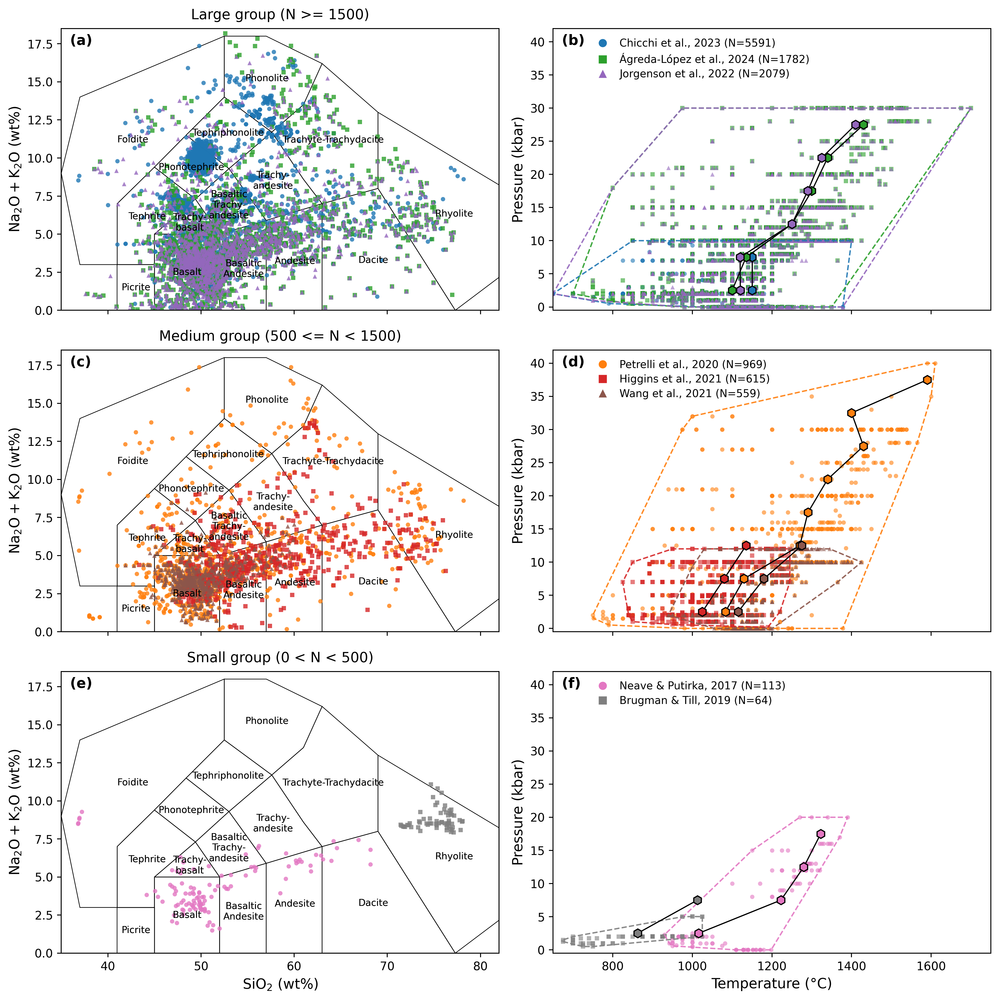

In [16]:
from paper.scripts.figure_helpers import (
    add_legend_fixed_ul__nb00_c24 as add_legend_fixed_ul,
    add_panel_labels__nb00_c24 as add_panel_labels,
    build_global_color_map__nb00_c24 as build_global_color_map,
    get_n_liq__nb00_c24 as get_n_liq,
    make_group_style__nb00_c24 as make_group_style,
    plot_tas_group__nb00_c24 as plot_tas_group,
    plot_tp_binned_median_trend__nb00_c24 as plot_tp_binned_median_trend,
    plot_tp_scatter_hull__nb00_c24 as plot_tp_scatter_hull,
    safe_numeric__nb00_c24 as safe_numeric,
)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.spatial import ConvexHull, QhullError

from aims4pt.visualization.composition_plot import plot_glass_TAS_diagram


# ============================================================
# User settings
# ============================================================
LARGE_TH = 1500
MED_TH = 500

# TAS columns
TAS_SIO2_COL = "SiO2_liq"
TAS_NA2O_COL = "Na2O_liq"
TAS_K2O_COL  = "K2O_liq"

# T-P columns
TP_T_COL = "T_C"
TP_P_COL = "P_kbar"

# Axis limits
TAS_XLIM = (35, 82)
TAS_YLIM = (0, 18.5)
TP_XLIM  = (650, 1750)
TP_YLIM  = (-0.5, 42)

# Styles
MARKERS_CYCLE = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>']
COLOR_CYCLE = plt.cm.tab10.colors
# Exclude gray from the color cycle.
COLOR_CYCLE = COLOR_CYCLE[0:8] + COLOR_CYCLE[9:10]


name2model = {n: m for n, m in zip(demo_model_name, demo_model)}
name2n = {n: get_n_liq(name2model[n]) for n in demo_model_name}

global_color_map = build_global_color_map(demo_model_name, COLOR_CYCLE)

large = [n for n in demo_model_name if name2n[n] >= LARGE_TH]
medium = [n for n in demo_model_name if MED_TH <= name2n[n] < LARGE_TH]
small = [n for n in demo_model_name if 0 < name2n[n] < MED_TH]

rows = [
    ("Large", large, 1),
    ("Medium", medium, 1),
    ("Small", small, 1),
]

row_styles = {r: make_group_style(names, global_color_map)
              for r, names, _ in rows}


# ============================================================
# Plot
# ============================================================
fig, axes = plt.subplots(3, 2, figsize=(12, 12), dpi=350)

for i, (row, names, min_bin) in enumerate(rows):
    ax_tas, ax_tp = axes[i]

    plot_tas_group(
        ax_tas, names, name2model, row_styles[row],
        scatter_style=dict(s=14, alpha=0.8, linewidths=0)
    )

    plot_tp_scatter_hull(
        ax_tp, names, name2model, row_styles[row],
        scatter_style=dict(s=14, alpha=0.6, linewidths=0)
    )

    plot_tp_binned_median_trend(
        ax_tp, names, name2model, row_styles[row],
        dp=5,
        min_per_bin=min_bin
    )

    # titles / labels (NO italic)
    if row == "Large":
        rule = f"(N >= {LARGE_TH})"
    elif row == "Medium":
        rule = f"({MED_TH} <= N < {LARGE_TH})"
    else:
        rule = f"(0 < N < {MED_TH})"
    ax_tas.set_title(f"{row} group {rule}", fontsize=12, pad=8)
    ax_tas.set_ylabel(r"$\mathrm{Na_2O + K_2O}$ (wt%)")
    ax_tp.set_ylabel("Pressure (kbar)")

    if i >= 2:
        ax_tas.set_xlabel(r"$\mathrm{SiO_2}$ (wt%)")
        ax_tp.set_xlabel("Temperature (°C)")
    else:
        ax_tas.set_xlabel("")
        ax_tp.set_xlabel("")
        ax_tas.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=False)
        ax_tp.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=False)



    add_legend_fixed_ul(ax_tp, names, row_styles[row], name2n)
add_panel_labels(axes)  # auto: (a)-(f) in row-major order

plt.tight_layout()
plt.show()


## Compared with GEOROC

Clean GEOROC cpx data and compare cpx composition fields against the independent experimental dataset and calibration datasets.

In [17]:
# CELL: cleaning/screen georoc data georoc_df_cleaned = 
# a coarse cleaning
georoc_df_cleaned = georoc_df.copy()


for col in cpx_names:
    if col in georoc_df_cleaned.columns:
        georoc_df_cleaned[col] = pd.to_numeric(georoc_df_cleaned[col], errors="coerce")
    else:
        georoc_df_cleaned[col] = 0.0

print("Before cleaning, georoc_df_cleaned shape:", georoc_df_cleaned.shape)
cpx_total = georoc_df_cleaned[cpx_names].sum(axis=1)
georoc_df_cleaned = georoc_df_cleaned[(cpx_total > 97) & (cpx_total < 103)].reset_index(drop=True)
print("After total, georoc_df_cleaned shape:", georoc_df_cleaned.shape)
cpx_params = cpx_calculation(georoc_df_cleaned[cpx_names])



Before cleaning, georoc_df_cleaned shape: (209882, 458)
After total, georoc_df_cleaned shape: (15810, 458)


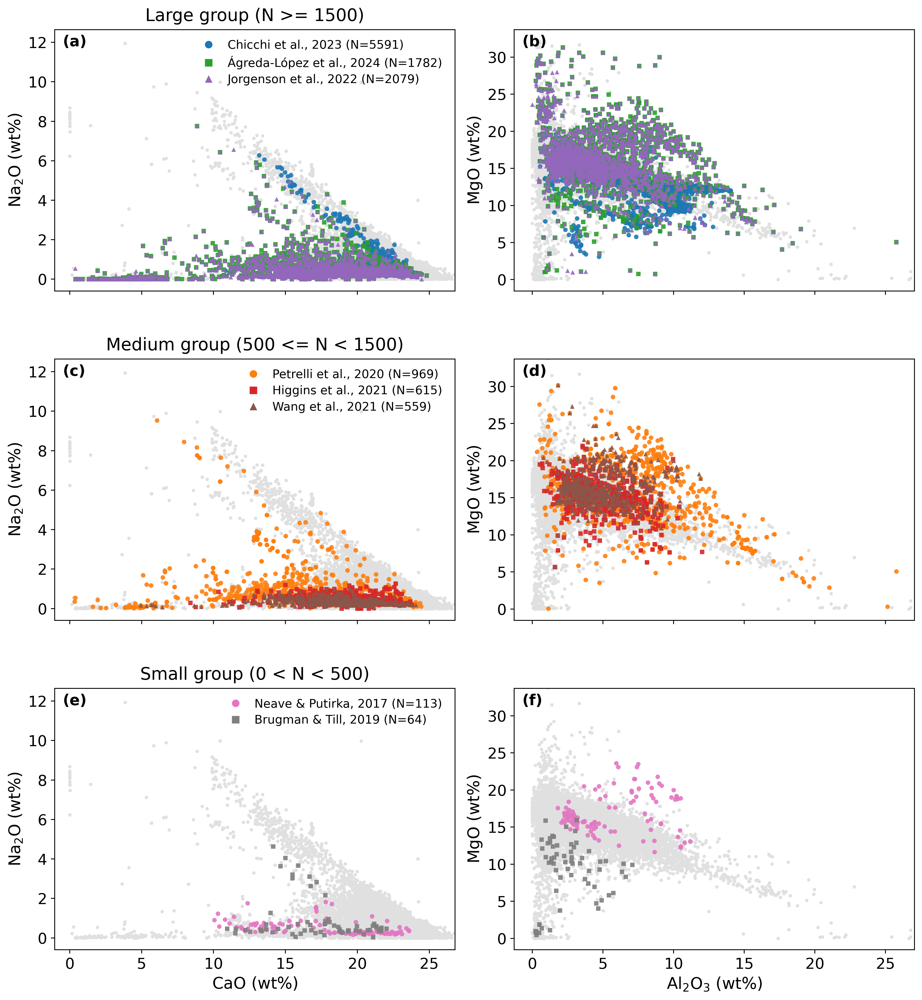

In [19]:
from paper.scripts.figure_helpers import (
    add_cpx_legend_fixed_ul__nb00_c27 as add_cpx_legend_fixed_ul,
    get_cpx_series__nb00_c27 as get_cpx_series,
    get_pair_limits__nb00_c27 as get_pair_limits,
    get_valid_xy__nb00_c27 as get_valid_xy,
    plot_cpx_pair__nb00_c27 as plot_cpx_pair,
)

# Cpx composition comparison against GEOROC.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

required_globals = [
    "georoc_df_cleaned", "demo_model", "demo_model_name", "LARGE_TH", "MED_TH",
    "MARKERS_CYCLE", "COLOR_CYCLE", "safe_numeric", "get_n_liq",
    "build_global_color_map", "make_group_style", "add_panel_labels",
]
missing = [name for name in required_globals if name not in globals()]
if missing:
    raise NameError(f"Missing required objects: {missing}. Run the setup cells and cell 45 first.")

AXIS_LABEL_SIZE = 15
TICK_LABEL_SIZE = 14
TITLE_SIZE = 16
LEGEND_FONT_SIZE = 11
LEGEND_MARKER_SIZE = 7
GEOROC_LIMIT_PERCENTILES = (1.0, 99.0)
PAIR_LIMITS_OVERRIDE = {
    ("CaO_cpx", "Na2O_cpx"): None,
    ("Al2O3_cpx", "MgO_cpx"): None,
}

cpx_pairs = [
    ("CaO_cpx", "Na2O_cpx", r"$\mathrm{CaO}$ (wt%)", r"$\mathrm{Na_2O}$ (wt%)"),
    ("Al2O3_cpx", "MgO_cpx", r"$\mathrm{Al_2O_3}$ (wt%)", r"$\mathrm{MgO}$ (wt%)"),
]
GEOROC_STYLE = dict(color="0.88", s=10, alpha=1, linewidths=0, marker="o", zorder=0)
GEOROC_LEGEND_STYLE = dict(color="0.88", alpha=1, markersize=LEGEND_MARKER_SIZE - 2)
MODEL_SCATTER_STYLE = dict(s=18, alpha=0.9, linewidths=0, zorder=3)


CPX_COLUMN_ALIASES = {
    "FeOt_cpx": ("FeO_cpx",),
    "FeO_cpx": ("FeOt_cpx",),
}




name2model = {name: model for name, model in zip(demo_model_name, demo_model)}
name2n = {name: get_n_liq(name2model[name]) for name in demo_model_name}

global_color_map = build_global_color_map(demo_model_name, COLOR_CYCLE)

large = [name for name in demo_model_name if name2n[name] >= LARGE_TH]
medium = [name for name in demo_model_name if MED_TH <= name2n[name] < LARGE_TH]
small = [name for name in demo_model_name if 0 < name2n[name] < MED_TH]

rows = [
    ("Large", large),
    ("Medium", medium),
    ("Small", small),
]
row_styles = {row: make_group_style(names, global_color_map) for row, names in rows}

georoc_plot_df = georoc_df_cleaned.copy()
for col in sorted({col for pair in cpx_pairs for col in pair[:2]}):
    georoc_plot_df[col] = pd.to_numeric(get_cpx_series(georoc_plot_df, col), errors="coerce")

pair_limits = {
    (x_col, y_col): get_pair_limits(
        name2model,
        georoc_plot_df,
        x_col,
        y_col,
        override_limits=PAIR_LIMITS_OVERRIDE[(x_col, y_col)],
    )
    for x_col, y_col, _, _ in cpx_pairs
}

fig, axes = plt.subplots(3, 2, figsize=(12, 13), dpi=350)

for i, (row, names) in enumerate(rows):
    if row == "Large":
        rule = f"(N >= {LARGE_TH})"
    elif row == "Medium":
        rule = f"({MED_TH} <= N < {LARGE_TH})"
    else:
        rule = f"(0 < N < {MED_TH})"

    for j, (x_col, y_col, x_label, y_label) in enumerate(cpx_pairs):
        ax = axes[i, j]
        georoc_n = plot_cpx_pair(ax, names, name2model, row_styles[row], georoc_plot_df, x_col, y_col)

        limits = pair_limits[(x_col, y_col)]
        if limits is not None:
            ax.set_xlim(limits[0], limits[1])
            ax.set_ylim(limits[2], limits[3])

        ax.set_ylabel(y_label, fontsize=AXIS_LABEL_SIZE)
        ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
        if i >= len(rows) - 1:
            ax.set_xlabel(x_label, fontsize=AXIS_LABEL_SIZE)
        else:
            ax.set_xlabel("")
            ax.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)

        if j == 0:
            ax.set_title(f"{row} group {rule}", fontsize=TITLE_SIZE, pad=8)
        else:
            ax.set_title("")

        if j == 0:
            add_cpx_legend_fixed_ul(
                ax,
                names,
                row_styles[row],
                name2n,
                georoc_n=georoc_n,
                include_georoc=False,
                loc="upper right",
                bbox_to_anchor=(0.98, 0.98),
            )

add_panel_labels(axes, fontsize=14)
plt.tight_layout()
plt.subplots_adjust(hspace=0.26)
# save 
# fig.savefig(
#     IMAGES_DIR / "cpx_compositions.png",
#     dpi=300,
#     bbox_inches="tight",
# )
plt.show()


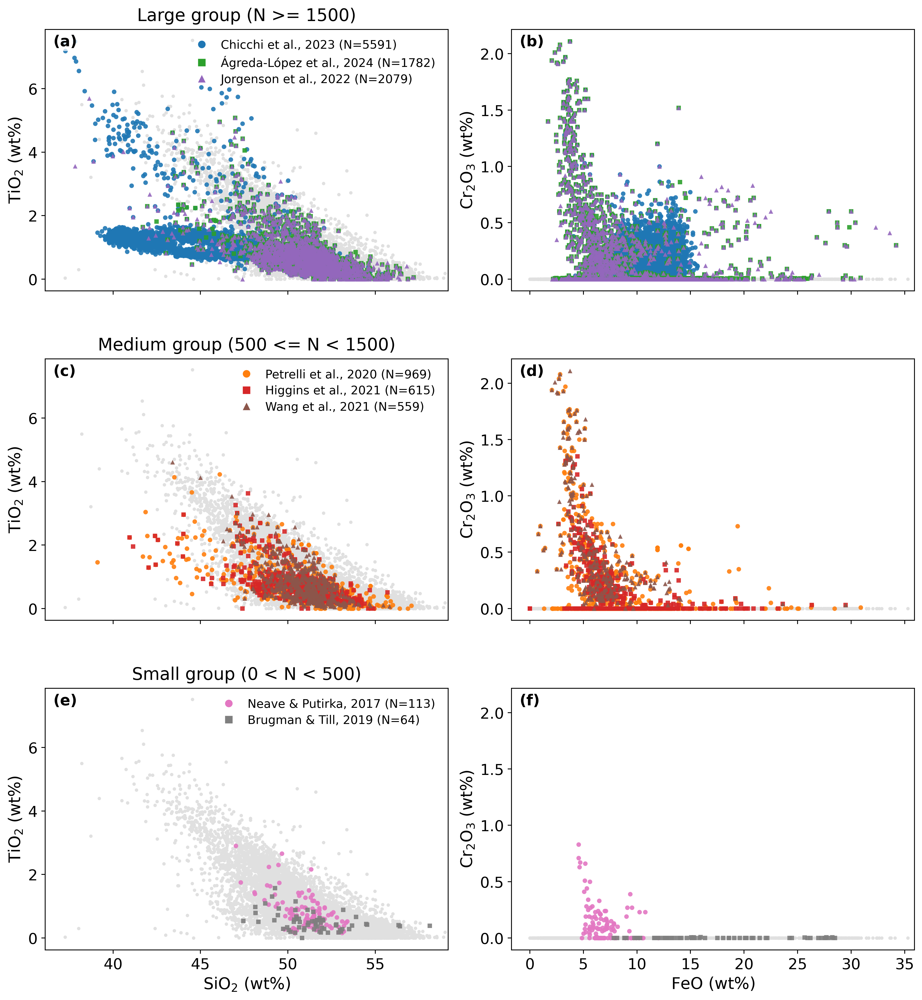

In [20]:
from paper.scripts.figure_helpers import (
    add_cpx_legend_fixed_ul__nb00_c28 as add_cpx_legend_fixed_ul,
    get_cpx_series__nb00_c28 as get_cpx_series,
    get_pair_limits__nb00_c28 as get_pair_limits,
    get_valid_xy__nb00_c28 as get_valid_xy,
    plot_cpx_pair__nb00_c28 as plot_cpx_pair,
)

# Cpx composition comparison against GEOROC.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

required_globals = [
    "georoc_df_cleaned", "demo_model", "demo_model_name", "LARGE_TH", "MED_TH",
    "MARKERS_CYCLE", "COLOR_CYCLE", "safe_numeric", "get_n_liq",
    "build_global_color_map", "make_group_style", "add_panel_labels",
]
missing = [name for name in required_globals if name not in globals()]
if missing:
    raise NameError(f"Missing required objects: {missing}. Run the setup cells and cell 45 first.")

AXIS_LABEL_SIZE = 15
TICK_LABEL_SIZE = 14
TITLE_SIZE = 16
LEGEND_FONT_SIZE = 11
LEGEND_MARKER_SIZE = 7
GEOROC_LIMIT_PERCENTILES = (1.0, 99.0)
PAIR_LIMITS_OVERRIDE = {
    ("SiO2_cpx", "TiO2_cpx"): None,
    ("FeO_cpx", "Cr2O3_cpx"): None,
}

cpx_pairs = [
    ("SiO2_cpx", "TiO2_cpx", r"$\mathrm{SiO_2}$ (wt%)", r"$\mathrm{TiO_2}$ (wt%)"),
    ("FeO_cpx", "Cr2O3_cpx", r"$\mathrm{FeO}$ (wt%)", r"$\mathrm{Cr_2O_3}$ (wt%)"),
]
GEOROC_STYLE = dict(color="0.88", s=10, alpha=1, linewidths=0, marker="o", zorder=0)
GEOROC_LEGEND_STYLE = dict(color="0.88", alpha=1, markersize=LEGEND_MARKER_SIZE - 2)
MODEL_SCATTER_STYLE = dict(s=18, alpha=0.9, linewidths=0, zorder=3)


CPX_COLUMN_ALIASES = {
    "FeOt_cpx": ("FeO_cpx",),
    "FeO_cpx": ("FeOt_cpx",),
}












name2model = {name: model for name, model in zip(demo_model_name, demo_model)}
name2n = {name: get_n_liq(name2model[name]) for name in demo_model_name}

global_color_map = build_global_color_map(demo_model_name, COLOR_CYCLE)

large = [name for name in demo_model_name if name2n[name] >= LARGE_TH]
medium = [name for name in demo_model_name if MED_TH <= name2n[name] < LARGE_TH]
small = [name for name in demo_model_name if 0 < name2n[name] < MED_TH]

rows = [
    ("Large", large),
    ("Medium", medium),
    ("Small", small),
]
row_styles = {row: make_group_style(names, global_color_map) for row, names in rows}

georoc_plot_df = georoc_df_cleaned.copy()
for col in sorted({col for pair in cpx_pairs for col in pair[:2]}):
    georoc_plot_df[col] = pd.to_numeric(get_cpx_series(georoc_plot_df, col), errors="coerce")

pair_limits = {
    (x_col, y_col): get_pair_limits(
        name2model,
        georoc_plot_df,
        x_col,
        y_col,
        override_limits=PAIR_LIMITS_OVERRIDE[(x_col, y_col)],
    )
    for x_col, y_col, _, _ in cpx_pairs
}

fig, axes = plt.subplots(3, 2, figsize=(12, 13), dpi=350)

for i, (row, names) in enumerate(rows):
    if row == "Large":
        rule = f"(N >= {LARGE_TH})"
    elif row == "Medium":
        rule = f"({MED_TH} <= N < {LARGE_TH})"
    else:
        rule = f"(0 < N < {MED_TH})"

    for j, (x_col, y_col, x_label, y_label) in enumerate(cpx_pairs):
        ax = axes[i, j]
        georoc_n = plot_cpx_pair(ax, names, name2model, row_styles[row], georoc_plot_df, x_col, y_col)

        limits = pair_limits[(x_col, y_col)]
        if limits is not None:
            ax.set_xlim(limits[0], limits[1])
            ax.set_ylim(limits[2], limits[3])

        ax.set_ylabel(y_label, fontsize=AXIS_LABEL_SIZE)
        ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
        if i >= len(rows) - 1:
            ax.set_xlabel(x_label, fontsize=AXIS_LABEL_SIZE)
        else:
            ax.set_xlabel("")
            ax.tick_params(axis="x", which="both", bottom=True, top=False, labelbottom=False)

        if j == 0:
            ax.set_title(f"{row} group {rule}", fontsize=TITLE_SIZE, pad=8)
        else:
            ax.set_title("")

        if j == 0:
            add_cpx_legend_fixed_ul(
                ax,
                names,
                row_styles[row],
                name2n,
                georoc_n=georoc_n,
                include_georoc=False,
                loc="upper right",
                bbox_to_anchor=(0.98, 0.98),
            )

add_panel_labels(axes, fontsize=14)
plt.tight_layout()
plt.subplots_adjust(hspace=0.26)
# save 
# fig.savefig(
#     IMAGES_DIR / "cpx_compositions.png",
#     dpi=300,
#     bbox_inches="tight",
# )
plt.show()


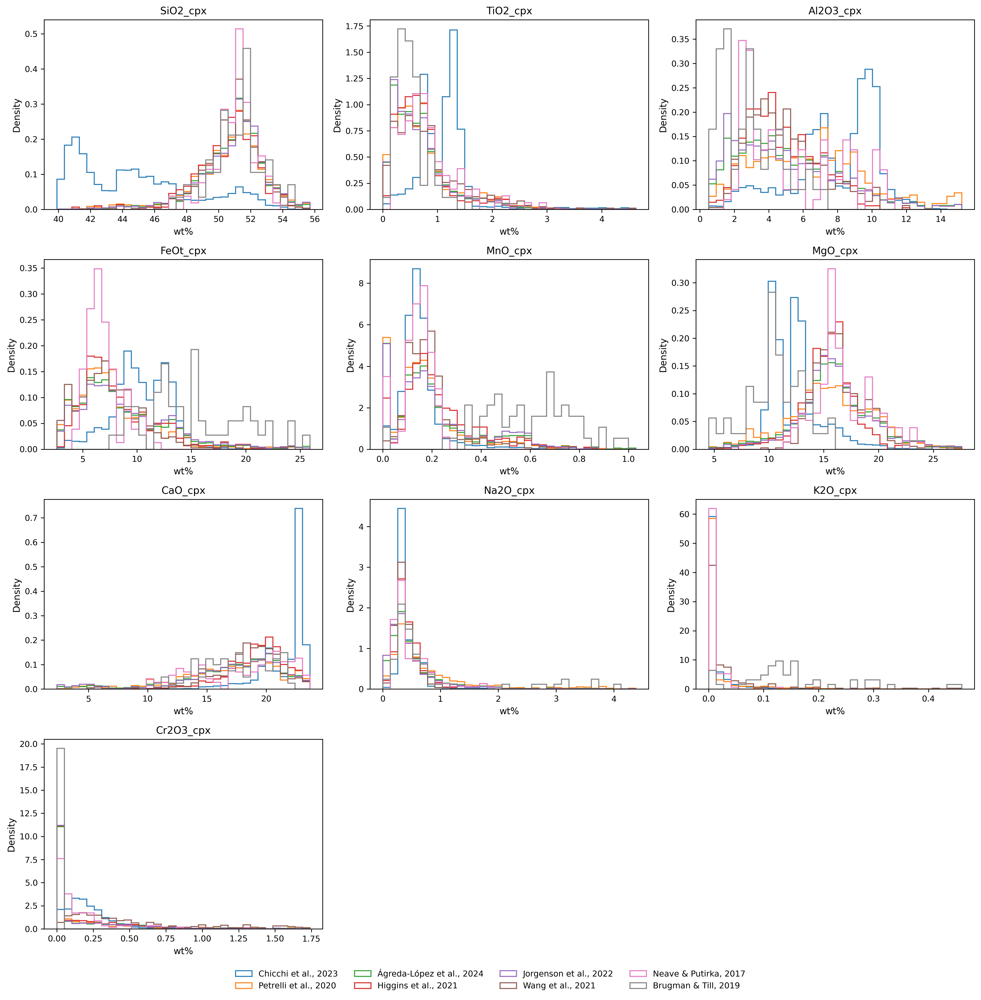

In [21]:
from paper.scripts.figure_helpers import (
    get_existing_cpx_series__nb00_c29 as get_existing_cpx_series,
)

# cell: histogram of cpx compositions, consider all compositions.
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

required_globals = ["demo_model", "demo_model_name"]
missing = [name for name in required_globals if name not in globals()]
if missing:
    raise NameError(f"Missing required objects: {missing}. Run the setup cells first.")

hist_cpx_names = [
    "SiO2_cpx", "TiO2_cpx", "Al2O3_cpx", "FeOt_cpx", "MnO_cpx",
    "MgO_cpx", "CaO_cpx", "Na2O_cpx", "K2O_cpx", "Cr2O3_cpx",
]

CPX_COLUMN_ALIASES = {
    "FeOt_cpx": ("FeO_cpx",),
    "FeO_cpx": ("FeOt_cpx",),
}




hist_frames = []
for name, model in zip(demo_model_name, demo_model):
    X_cpx = getattr(model, "X_cpx_all", None)
    if X_cpx is None:
        continue
    for col in hist_cpx_names:
        series = get_existing_cpx_series(X_cpx, col)
        if series is None:
            continue
        values = pd.to_numeric(series, errors="coerce")
        values = values[np.isfinite(values)]
        if values.empty:
            continue
        hist_frames.append(pd.DataFrame({"model": name, "oxide": col, "value": values.to_numpy()}))

if not hist_frames:
    raise ValueError("No model cpx composition data found for the selected oxide columns.")
cpx_hist_df = pd.concat(hist_frames, ignore_index=True)

n_cols = 3
n_rows = math.ceil(len(hist_cpx_names) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows), dpi=300)
axes = np.asarray(axes).ravel()

model_names = list(cpx_hist_df["model"].drop_duplicates())
model_colors = {name: COLOR_CYCLE[i % len(COLOR_CYCLE)] for i, name in enumerate(model_names)} if "COLOR_CYCLE" in globals() else None
legend_handles = {}

for ax, col in zip(axes, hist_cpx_names):
    oxide_df = cpx_hist_df[cpx_hist_df["oxide"].eq(col)]
    values = oxide_df["value"]
    if values.empty:
        ax.set_visible(False)
        continue

    x_min, x_max = np.nanpercentile(values, [0.5, 99.5])
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        x_min, x_max = values.min(), values.max()
    bins = np.linspace(x_min, x_max, 35) if x_min < x_max else 20

    for model_name in model_names:
        group_values = oxide_df.loc[oxide_df["model"].eq(model_name), "value"]
        group_values = group_values[(group_values >= x_min) & (group_values <= x_max)]
        if group_values.empty:
            continue
        hist_kwargs = dict(histtype="step", linewidth=1.2, alpha=0.9)
        if model_colors is not None:
            hist_kwargs["color"] = model_colors[model_name]
        _, _, patches = ax.hist(group_values, bins=bins, density=True, label=model_name, **hist_kwargs)
        if model_name not in legend_handles and patches:
            legend_handles[model_name] = patches[0]

    ax.set_title(col, fontsize=11)
    ax.set_xlabel("wt%", fontsize=10)
    ax.set_ylabel("Density", fontsize=10)
    ax.tick_params(labelsize=9)

for ax in axes[len(hist_cpx_names):]:
    ax.set_visible(False)

if legend_handles:
    fig.legend(
        [legend_handles[name] for name in model_names if name in legend_handles],
        [name for name in model_names if name in legend_handles],
        loc="lower center",
        bbox_to_anchor=(0.5, 0.05),
        ncol=min(4, len(legend_handles)),
        frameon=False,
        fontsize=9,
    )



fig.tight_layout(rect=(0, 0.08, 1, 1))

# save.
fig.savefig(IMAGES_DIR / "cpx_composition_histograms.png"
            , dpi=300, bbox_inches="tight")
